**Authored by:**
- Engr / PI : Hassan Javaid 
- Dept: SRDC Lahore
- Org : SUPARCO 

IMAGE reading to scale, total tile time including info display takes about 30 seconds or so if scale_factor not included during image reading

IMAGE INFORMATION
File            : /home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/maxar-dataset-pak/la-wildfire-59cm/103001010C487900-visual.tif
Width           : 17408
Height          : 17408
Bands           : 3
Data Type       : ('uint8', 'uint8', 'uint8')
CRS             : EPSG:32611
NoData          : None
ColorInterp     : (<ColorInterp.red: 3>, <ColorInterp.green: 4>, <ColorInterp.blue: 5>)

Affine Transform
| 0.31, 0.00, 394843.75|
| 0.00,-0.31, 3785156.25|
| 0.00, 0.00, 1.00|

BAND INFORMATION
Total Bands     : 3
Band 1: name='Band 1', description='No description available'
Band 2: name='Band 2', description='No description available'
Band 3: name='Band 3', description='No description available'

BAND STATISTICS
Band 1: min:        0 max:      255 mean:     108.91 std:      60.33
P1: 6  P5: 21  P95: 216  P99: 244  P99.5: 251  P99.9: 255
Band 2: min:        0 max:      255 mean:     103.15 std:      52.85
P1: 9  P5: 26  P95: 200  P99: 233  P99.5: 242  P99.9: 254
Band

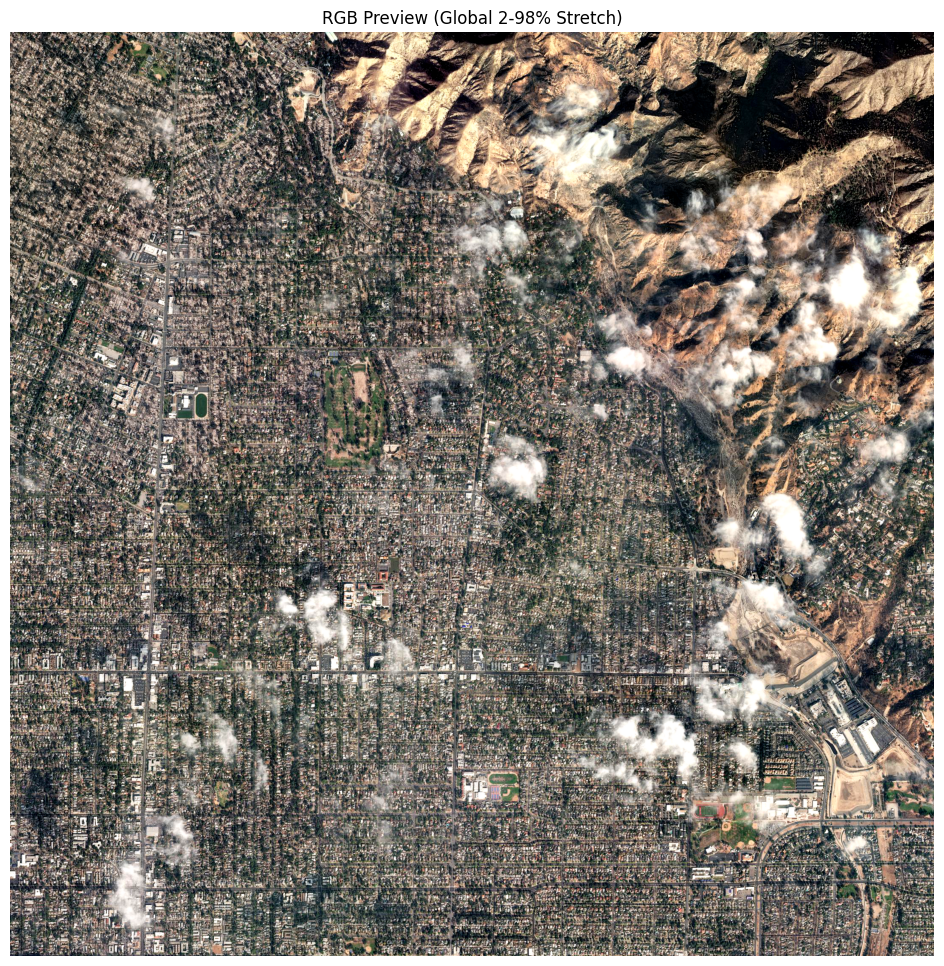

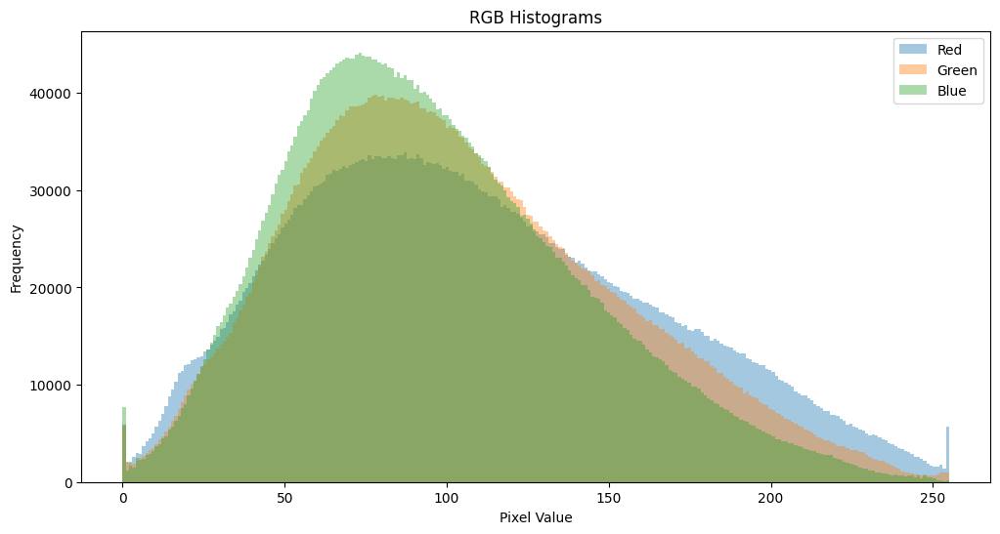


CHANNEL MEANS
Red Mean   : 108.90
Green Mean : 103.16
Blue Mean  : 96.24


In [1]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

# ==================================================
# CHANGE ONLY THIS
# ==================================================
# image_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/airbus/IMG_PNEO3_STD_202601250555400_PMS-FS_ORT_1e224074-3a2a-4f29-cfe4-ab0a484fbd47_NED_R1C1.JP2"
# image_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/airbus/IMG_PNEO3_STD_202601250555400_PMS-FS_ORT_1e224074-3a2a-4f29-cfe4-ab0a484fbd47_RGB_R1C1.JP2"
# image_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/maxar-samples/Rome_Colosseum_2022-03-22_WV03_HD/050012575010_01/050012575010_01_P001_PSH/22MAR22095810-S2AS-050012575010_01_P001.TIF"
# image_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/maxar-samples/Barcelona_2022-04-01_WV03_HD/050012560010_01/050012560010_01_P001_PSH/22APR01105255-S3DS_R1C1-050012560010_01_P001.TIF"
# image_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/maxar-dataset-pak/pakistan-flood-images-36cm/single-img/1040010076369100-visual.tif"
image_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/maxar-dataset-pak/la-wildfire-59cm/103001010C487900-visual.tif"
# ==================================================

# --------------------------------------------------
# OPEN IMAGE
# --------------------------------------------------

with rasterio.open(image_path) as src:

    print("=" * 80)
    print("IMAGE INFORMATION")
    print("=" * 80)

    print(f"File            : {image_path}")
    print(f"Width           : {src.width}")
    print(f"Height          : {src.height}")
    print(f"Bands           : {src.count}")
    print(f"Data Type       : {src.dtypes}")
    print(f"CRS             : {src.crs}")
    print(f"NoData          : {src.nodata}")
    print(f"ColorInterp     : {src.colorinterp}")

    print("\nAffine Transform")
    print(src.transform)

    print("\n" + "=" * 80)
    print("BAND INFORMATION")
    print("=" * 80)

    print(f"Total Bands     : {src.count}")

    for band_idx in range(1, src.count + 1):
        tags = src.tags(band_idx)

        band_name = (
            src.descriptions[band_idx - 1]
            or tags.get("BAND_NAME")
            or tags.get("band_name")
            or tags.get("NAME")
            or tags.get("name")
            or f"Band {band_idx}"
        )

        band_description = (
            tags.get("DESCRIPTION")
            or tags.get("description")
            or tags.get("DESC")
            or tags.get("desc")
            or "No description available"
        )

        print(f"Band {band_idx}: name='{band_name}', description='{band_description}'")



    print("\n" + "=" * 80)
    print("BAND STATISTICS")
    print("=" * 80)

    for band_idx in range(1, src.count + 1):

        band = src.read(band_idx)

        print(
            f"Band {band_idx}: "
            f"min: {band.min():>8} "
            f"max: {band.max():>8} "
            f"mean: {band.mean():>10.2f} "
            f"std: {band.std():>10.2f}"
        )

        print(
            f"P1: {np.percentile(band, 1):.0f}  "
            f"P5: {np.percentile(band, 5):.0f}  "
            f"P95: {np.percentile(band, 95):.0f}  "
            f"P99: {np.percentile(band, 99):.0f}  "
            f"P99.5: {np.percentile(band, 99.5):.0f}  "
            f"P99.9: {np.percentile(band, 99.9):.0f}"
        )


    # --------------------------------------------------
    # Read RGB bands 
    # --------------------------------------------------

    # rgb = src.read([1, 2, 3])
    scale_factor = 8

    rgb = src.read(
        [1, 2, 3]            
,
        out_shape=(
            3,
            src.height // scale_factor,
            src.width // scale_factor
        )
    )

# --------------------------------------------------
# PREPARE RGB IMAGE
# --------------------------------------------------

rgb = np.transpose(rgb, (1, 2, 0)).astype(np.float32)

# --------------------------------------------------
# GLOBAL PERCENTILE STRETCH
# (Preserves color balance)
# --------------------------------------------------

low = np.percentile(rgb, 2)
high = np.percentile(rgb, 98)

rgb_display = (rgb - low) / (high - low)
rgb_display = np.clip(rgb_display, 0, 1)

print("\n" + "=" * 80)
print("DISPLAY STRETCH")
print("=" * 80)

print(f"Global P2  : {low:.2f}")
print(f"Global P98 : {high:.2f}")

# --------------------------------------------------
# DISPLAY IMAGE
# --------------------------------------------------

plt.figure(figsize=(12, 12))
plt.imshow(rgb_display)
plt.title("RGB Preview (Global 2-98% Stretch)")
plt.axis("off")
plt.show()

# --------------------------------------------------
# RGB HISTOGRAMS
# --------------------------------------------------

plt.figure(figsize=(12, 6))

for i, label in enumerate(["Red", "Green", "Blue"]):
    plt.hist(
        rgb[:, :, i].ravel(),
        bins=256,
        alpha=0.4,
        label=label
    )

plt.title("RGB Histograms")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.legend()
plt.show()

# --------------------------------------------------
# CHANNEL MEANS SUMMARY
# --------------------------------------------------

print("\n" + "=" * 80)
print("CHANNEL MEANS")
print("=" * 80)

print(f"Red Mean   : {rgb[:,:,0].mean():.2f}")
print(f"Green Mean : {rgb[:,:,1].mean():.2f}")
print(f"Blue Mean  : {rgb[:,:,2].mean():.2f}")

In [16]:
from osgeo import gdal

# Enable explicit exceptions to catch errors cleanly
gdal.UseExceptions()

try:
    file_path = image_path
    dataset = gdal.Open(file_path)
    print(gdal.Info(dataset))
except Exception as e:
    print(f"Error opening file: {e}")


Driver: GTiff/GeoTIFF
Files: /home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/maxar-dataset-pak/la-wildfire-59cm/103001010C487900-visual.tif
Size is 17408, 17408
Coordinate System is:
PROJCRS["WGS 84 / UTM zone 11N",
    BASEGEOGCRS["WGS 84",
        DATUM["World Geodetic System 1984",
            ELLIPSOID["WGS 84",6378137,298.257223563,
                LENGTHUNIT["metre",1]]],
        PRIMEM["Greenwich",0,
            ANGLEUNIT["degree",0.0174532925199433]],
        ID["EPSG",4326]],
    CONVERSION["UTM zone 11N",
        METHOD["Transverse Mercator",
            ID["EPSG",9807]],
        PARAMETER["Latitude of natural origin",0,
            ANGLEUNIT["degree",0.0174532925199433],
            ID["EPSG",8801]],
        PARAMETER["Longitude of natural origin",-117,
            ANGLEUNIT["degree",0.0174532925199433],
            ID["EPSG",8802]],
        PARAMETER["Scale factor at natural origin",0.9996,
            SCALEUNIT["unity",1],
            ID["EPSG",8805]],
        P

In [17]:
!gdalinfo "{image_path}"

Driver: GTiff/GeoTIFF
Files: /home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/maxar-dataset-pak/la-wildfire-59cm/103001010C487900-visual.tif
Size is 17408, 17408
Coordinate System is:
PROJCRS["WGS 84 / UTM zone 11N",
    BASEGEOGCRS["WGS 84",
        DATUM["World Geodetic System 1984",
            ELLIPSOID["WGS 84",6378137,298.257223563,
                LENGTHUNIT["metre",1]]],
        PRIMEM["Greenwich",0,
            ANGLEUNIT["degree",0.0174532925199433]],
        ID["EPSG",4326]],
    CONVERSION["UTM zone 11N",
        METHOD["Transverse Mercator",
            ID["EPSG",9807]],
        PARAMETER["Latitude of natural origin",0,
            ANGLEUNIT["degree",0.0174532925199433],
            ID["EPSG",8801]],
        PARAMETER["Longitude of natural origin",-117,
            ANGLEUNIT["degree",0.0174532925199433],
            ID["EPSG",8802]],
        PARAMETER["Scale factor at natural origin",0.9996,
            SCALEUNIT["unity",1],
            ID["EPSG",8805]],
        P

In [ ]:
import os
from pathlib import Path
from PIL import Image, ImageFile
import numpy as np

# ==================================================================
# INTELLIGENT IMAGE LOADER - Handles BOTH Geospatial + PNG formats
# ==================================================================
# JUSTIFICATION:
#   - PIL can't downsample on read (OOM on 300MB PNG)
#   - Tiling approach: read PNG in blocks, downsample each block
#   - Auto-detects format by extension
#   - Drop-in replacement for rasterio in display pipelines
# ==================================================================

def load_large_png_tiled(image_path: str, scale_factor: int = 8, tile_size: int = 512):
    """
    Memory-efficient PNG loader using tiling + downsampling.
    
    Parameters
    ----------
    image_path : str
        Path to PNG file
    scale_factor : int
        Downsampling factor (e.g., 8 = 1/8 size)
    tile_size : int
        Tile size for reading blocks (prevent OOM)
    
    Returns
    -------
    rgb : np.ndarray (H, W, 3) uint8
        Downsampled RGB image
    """
    # Allow valid large satellite PNGs by disabling PIL size limits for this loader only
    Image.MAX_IMAGE_PIXELS = None
    ImageFile.LOAD_TRUNCATED_IMAGES = True
    img = Image.open(image_path)
    
    # Get original dimensions
    orig_width, orig_height = img.size
    downsampled_width = orig_width // scale_factor
    downsampled_height = orig_height // scale_factor
    
    print(f"[PNG Tiled Loader]")
    print(f"  Original size: {orig_width} × {orig_height}")
    print(f"  Scale factor: {scale_factor}×")
    print(f"  Output size: {downsampled_width} × {downsampled_height}")
    print(f"  Tile size: {tile_size}")
    
    # Create output array
    rgb_out = np.zeros((downsampled_height, downsampled_width, 3), dtype=np.uint8)
    
    # Process image in tiles
    num_tiles_h = (orig_height + tile_size - 1) // tile_size
    num_tiles_w = (orig_width + tile_size - 1) // tile_size
    total_tiles = num_tiles_h * num_tiles_w
    
    tile_count = 0
    for tile_y in range(0, orig_height, tile_size):
        for tile_x in range(0, orig_width, tile_size):
            tile_count += 1
            if tile_count % max(1, total_tiles // 10) == 0 or tile_count == total_tiles:
                print(f"  Progress: {tile_count}/{total_tiles} tiles")
            if tile_count % max(1, total_tiles // 10) == 0 or tile_count == total_tiles:
                print(f"  Progress: {tile_count}/{total_tiles} tiles")
            
            # Read tile region
            x1, y1 = tile_x, tile_y
            x2 = min(tile_x + tile_size, orig_width)
            y2 = min(tile_y + tile_size, orig_height)
            
            tile = img.crop((x1, y1, x2, y2))
            tile_array = np.array(tile, dtype=np.uint8)
            
            # Handle grayscale → RGB
            if tile_array.ndim == 2:
                tile_array = np.stack([tile_array] * 3, axis=2)
            elif tile_array.shape[2] == 4:  # RGBA → RGB
                tile_array = tile_array[:, :, :3]
            
            # Downsample tile
            h, w = tile_array.shape[:2]
            h_down = max(1, h // scale_factor)
            w_down = max(1, w // scale_factor)
            tile_down = np.array(
                Image.fromarray(tile_array).resize((w_down, h_down), Image.Resampling.LANCZOS)
            )
            
            # Write to output
            out_y1 = (tile_y // scale_factor)
            out_x1 = (tile_x // scale_factor)
            out_y2 = out_y1 + h_down
            out_x2 = out_x1 + w_down
            rgb_out[out_y1:out_y2, out_x1:out_x2] = tile_down
    
    print(f"  ✓ Loaded successfully")
    return rgb_out


def auto_load_image(image_path: str, scale_factor: int = 8):
    """
    Auto-detect format and load image efficiently.
    
    - PNG files: Use tiled PIL loader
    - JP2/GeoTIFF: Use rasterio (existing code)
    """
    ext = Path(image_path).suffix.lower()
    
    if ext == ".png":
        print(f"[Auto-Detect] PNG detected → using tiled PIL loader")
        return load_large_png_tiled(image_path, scale_factor), "png"
    elif ext in [".jp2", ".tif", ".tiff"]:
        print(f"[Auto-Detect] {ext.upper()} detected → using rasterio")
        return None, ext  # Signal to use rasterio path
    else:
        raise ValueError(f"Unsupported format: {ext}")


## NEW: Unified Image Viewer for PNG + Geospatial Formats
**CHANGE LOG:**
- ✅ Added `auto_load_image()` - format auto-detection (PNG/JP2/GeoTIFF)
- ✅ Added `load_large_png_tiled()` - memory-efficient PNG tiling (prevents OOM on 300MB+)
- ✅ Works with both SR outputs (PNG) and source GeoTIFF/JP2
- ✅ Downsamples on read to fit in memory (scale_factor=8 → 1/64 original size)

**When to use:**
- Large PNG files (>100MB): Use this cell
- GeoTIFF/JP2 with geospatial metadata: Use original rasterio cells above


[Auto-Detect] PNG detected → using tiled PIL loader
[PNG Tiled Loader]
  Original size: 17408 × 17408
  Scale factor: 8×
  Output size: 2176 × 2176
  Tile size: 512
  Progress: 115/1156 tiles
  Progress: 115/1156 tiles
  Progress: 230/1156 tiles
  Progress: 230/1156 tiles
  Progress: 345/1156 tiles
  Progress: 345/1156 tiles
  Progress: 460/1156 tiles
  Progress: 460/1156 tiles
  Progress: 575/1156 tiles
  Progress: 575/1156 tiles
  Progress: 690/1156 tiles
  Progress: 690/1156 tiles
  Progress: 805/1156 tiles
  Progress: 805/1156 tiles
  Progress: 920/1156 tiles
  Progress: 920/1156 tiles
  Progress: 1035/1156 tiles
  Progress: 1035/1156 tiles
  Progress: 1150/1156 tiles
  Progress: 1150/1156 tiles
  Progress: 1156/1156 tiles
  Progress: 1156/1156 tiles
  ✓ Loaded successfully

Loaded PNG: shape=(2176, 2176, 3), dtype=uint8
Contrast stretch: P2=34.0, P98=247.0


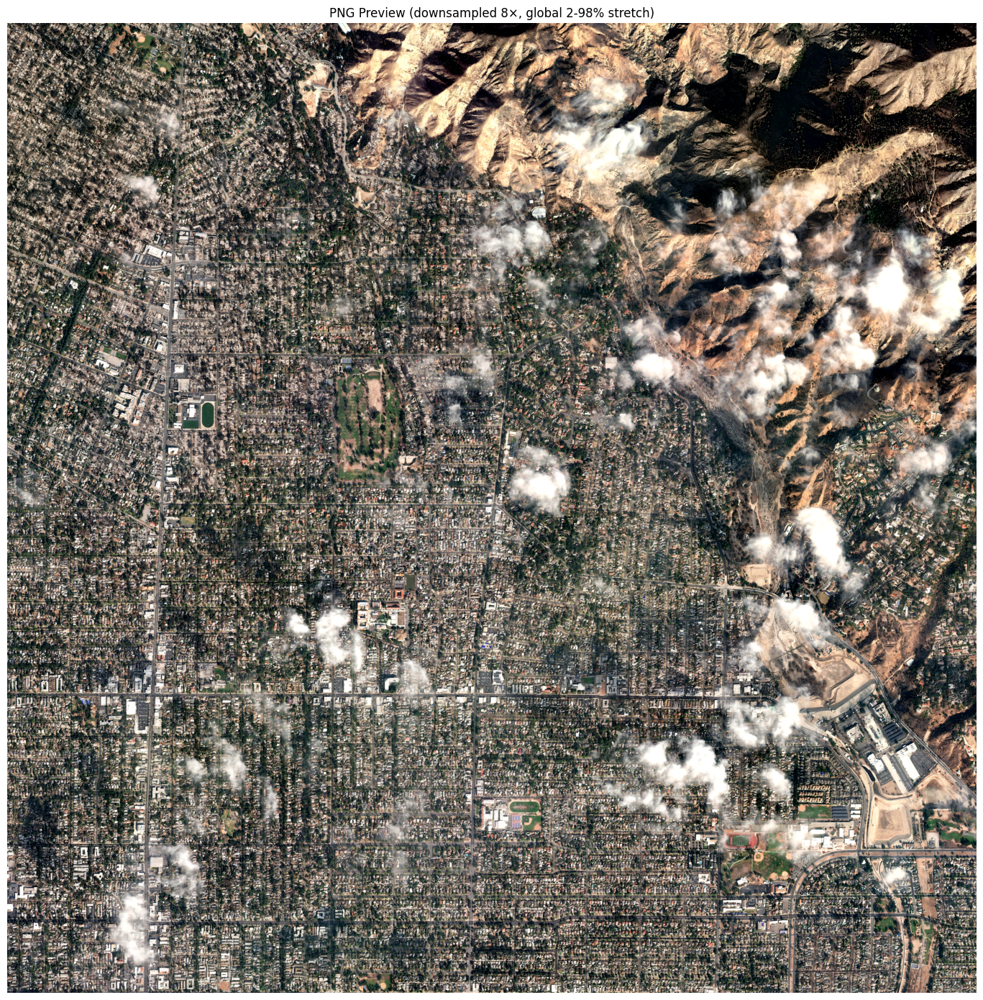

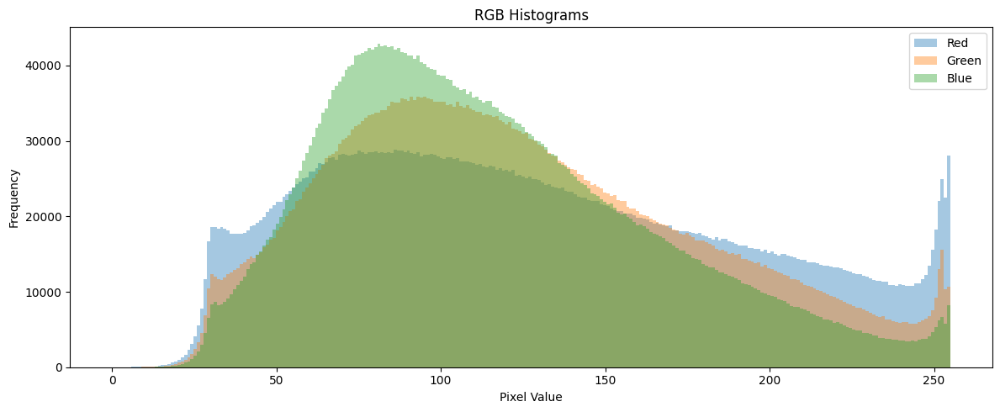


CHANNEL STATISTICS (after downsampling)
Red  : min=  0  max=255  mean=  128.4  std=   61.5
Green: min=  0  max=255  mean=  122.9  std=   53.9
Blue : min=  0  max=255  mean=  115.2  std=   49.0


In [3]:
# ==================================================
# LOAD & DISPLAY LARGE PNG (e.g., SR output)
# ==================================================
# CHANGE ONLY THIS
# sr_image_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/airbus/outputs/sr_x2/IMG_PNEO3_STD_202601250555400_PMS-FS_ORT_1e224074-3a2a-4f29-cfe4-ab0a484fbd47_RGB_R1C1_SwinIR.png"
# sr_image_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/lr-degraded-outputs/Rome_Colosseum_2022-03-22_WV03_HD_01_P001/sr_x2/22MAR22095810-S2AS-050012575010_01_P001_SwinIR.png"
# sr_image_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/lr-degraded-outputs/Barcelona_2022-04-01_WV03_HD/sr_x2/22APR01105255-S3DS_R1C1-050012560010_01_P001_SwinIR.png"
# sr_image_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/lr-degraded-outputs/maxar-dataset-pak/pakistan-flood-images-36cm/sr_x2/1040010076369100-visual_SwinIR.png"
sr_image_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/lr-degraded-outputs/maxar-dataset-pak/la-wildfire-59cm/sr_x2/103001010C487900-visual_SwinIR.png"

scale_factor = 8
# ==================================================
import matplotlib.pyplot as plt
result, fmt = auto_load_image(sr_image_path, scale_factor)

# If PNG: result contains numpy array. If JP2: use rasterio code below
if fmt == "png":
    rgb = result
    print(f"\nLoaded PNG: shape={rgb.shape}, dtype={rgb.dtype}")
    
    # --------------------------------------------------
    # NORMALIZE & DISPLAY
    # --------------------------------------------------
    rgb_display = rgb.astype(np.float32)
    
    low = np.percentile(rgb_display, 2)
    high = np.percentile(rgb_display, 98)
    
    rgb_display = (rgb_display - low) / (high - low)
    rgb_display = np.clip(rgb_display, 0, 1)
    
    print(f"Contrast stretch: P2={low:.1f}, P98={high:.1f}")
    
    # Display
    plt.figure(figsize=(14, 14))
    plt.imshow(rgb_display)
    plt.title(f"PNG Preview (downsampled {scale_factor}×, global 2-98% stretch)")
    plt.axis("off")
    plt.tight_layout()
    plt.show()
    
    # Histograms
    plt.figure(figsize=(12, 5))
    for i, label in enumerate(["Red", "Green", "Blue"]):
        plt.hist(rgb[:, :, i].ravel(), bins=256, alpha=0.4, label=label)
    plt.title("RGB Histograms")
    plt.xlabel("Pixel Value")
    plt.ylabel("Frequency")
    plt.legend()
    plt.tight_layout()
    plt.show()
    
    # Statistics
    print("\n" + "=" * 80)
    print("CHANNEL STATISTICS (after downsampling)")
    print("=" * 80)
    for i, label in enumerate(["Red", "Green", "Blue"]):
        ch = rgb[:, :, i]
        print(f"{label:5s}: min={ch.min():3d}  max={ch.max():3d}  mean={ch.mean():7.1f}  std={ch.std():7.1f}")
else:
    print(f"Format detected: {fmt} (use rasterio code cells above)")


## SR Quality Assessment Framework
**Q: How to judge if your SR model actually works?**

**Answer: 5-layer assessment strategy:**

1. **Visual Inspection** — Crop patches at full resolution (no downsampling)
2. **Side-by-Side Grid** — LR vs SR vs HR at same downsampled scale
3. **Quantitative Metrics** — PSNR, SSIM from log (already computed)
4. **Frequency Analysis** — Check high-frequency detail recovery
5. **Difference Maps** — Show what SR added vs. HR reference

**What to look for (SR working indicators):**
- ✅ SR should have MORE sharp edges than LR
- ✅ SR details should match HR (not hallucinated)
- ✅ No colored artifacts at edges
- ✅ PSNR significantly higher than LR→HR bicubic baseline
- ✅ Frequency spectrum shows energy in high frequencies (not just low-pass)


USE exiftool command to output image details, metadata info, size and pixels and resolution and other info

LR shape: (8704, 8704, 3)
SR shape: (17408, 17408, 3)
HR shape: (17408, 17408, 3)

Cropped regions (center patch, 256×256 SR space)
LR crop shape: (128, 128, 3)
SR crop shape: (256, 256, 3)
HR crop shape: (256, 256, 3)

Metrics vs. HR (center crop):
  SR-PSNR:      19.85 dB
  SR-SSIM:      0.6182
  Bicubic-PSNR: 20.59 dB  (baseline)
  Bicubic-SSIM: 0.6358  (baseline)
  PSNR gain:    -0.74 dB  ✗ Worse


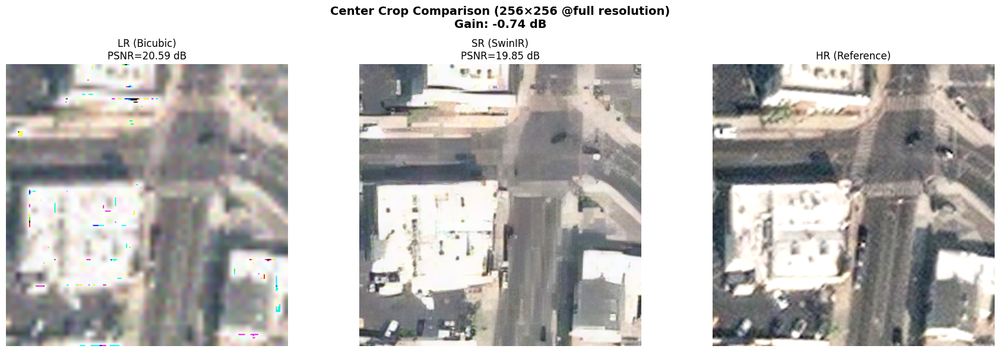

In [ ]:
from skimage.metrics import structural_similarity as ssim, peak_signal_noise_ratio as psnr
import cv2
# Paths
lr_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/lr-degraded-outputs/maxar-dataset-pak/la-wildfire-59cm/103001010C487900-visual/lr_x2/103001010C487900-visual.png"
sr_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/lr-degraded-outputs/maxar-dataset-pak/la-wildfire-59cm/sr_x2/103001010C487900-visual_SwinIR.png"
hr_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/lr-degraded-outputs/maxar-dataset-pak/la-wildfire-59cm/103001010C487900-visual/hr_processed/103001010C487900-visual.png"

# lr_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/lr-degraded-outputs/maxar-dataset-pak/pakistan-floods-36cm/1040010076369100-visual/lr_x2/1040010076369100-visual.png"
# sr_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/lr-degraded-outputs/maxar-dataset-pak/pakistan-flood-images-36cm/sr_x2/1040010076369100-visual_SwinIR.png"
# hr_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/lr-degraded-outputs/maxar-dataset-pak/pakistan-floods-36cm/1040010076369100-visual/hr_processed/1040010076369100-visual.png"

# lr_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/airbus/outputs/lr_x2/IMG_PNEO3_STD_202601250555400_PMS-FS_ORT_1e224074-3a2a-4f29-cfe4-ab0a484fbd47_RGB_R1C1.png"
# sr_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/airbus/outputs/sr_x2/IMG_PNEO3_STD_202601250555400_PMS-FS_ORT_1e224074-3a2a-4f29-cfe4-ab0a484fbd47_RGB_R1C1_SwinIR.png"
# hr_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/airbus/outputs/hr_processed/IMG_PNEO3_STD_202601250555400_PMS-FS_ORT_1e224074-3a2a-4f29-cfe4-ab0a484fbd47_RGB_R1C1.png"

# lr_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/lr-degraded-outputs/Rome_Colosseum_2022-03-22_WV03_HD_01_P001/lr_x2/22MAR22095810-S2AS-050012575010_01_P001.png"
# sr_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/lr-degraded-outputs/Rome_Colosseum_2022-03-22_WV03_HD_01_P001/sr_x2/22MAR22095810-S2AS-050012575010_01_P001_SwinIR.png"
# hr_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/lr-degraded-outputs/Rome_Colosseum_2022-03-22_WV03_HD_01_P001/hr_processed/22MAR22095810-S2AS-050012575010_01_P001.png"

# lr_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/lr-degraded-outputs/Barcelona_2022-04-01_WV03_HD/lr_x2/22APR01105255-S3DS_R1C1-050012560010_01_P001.png"
# sr_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/lr-degraded-outputs/Barcelona_2022-04-01_WV03_HD/sr_x2/22APR01105255-S3DS_R1C1-050012560010_01_P001_SwinIR.png"
# hr_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/maxar-samples/Barcelona_2022-04-01_WV03_HD/050012560010_01/050012560010_01_P001_PSH/22APR01105255-S3DS_R1C1-050012560010_01_P001.TIF"

# Load images
lr_img = cv2.imread(lr_path, cv2.IMREAD_COLOR).astype(np.float32) / 255.0
sr_img = cv2.imread(sr_path, cv2.IMREAD_COLOR).astype(np.float32) / 255.0
hr_img = cv2.imread(hr_path, cv2.IMREAD_COLOR).astype(np.float32) / 255.0

print(f"LR shape: {lr_img.shape}")
print(f"SR shape: {sr_img.shape}")
print(f"HR shape: {hr_img.shape}")

# Extract crop from center (interesting region with detail)
crop_size = 256  # 256×256 patch at FULL RESOLUTION (no downsampling)

# Center coordinates
sr_h, sr_w = sr_img.shape[:2]
cx, cy = sr_w // 2, sr_h // 2
x1 = max(0, cx - crop_size // 2)
x2 = min(sr_w, x1 + crop_size)
y1 = max(0, cy - crop_size // 2)
y2 = min(sr_h, y1 + crop_size)

sr_crop = sr_img[y1:y2, x1:x2]
hr_crop = hr_img[y1:y2, x1:x2]

# LR crop (at LR resolution)
lr_y1 = y1 // 2
lr_y2 = y2 // 2
lr_x1 = x1 // 2
lr_x2 = x2 // 2
lr_crop = lr_img[lr_y1:lr_y2, lr_x1:lr_x2]

print(f"\n{'='*70}")
print(f"Cropped regions (center patch, {crop_size}×{crop_size} SR space)")
print(f"{'='*70}")
print(f"LR crop shape: {lr_crop.shape}")
print(f"SR crop shape: {sr_crop.shape}")
print(f"HR crop shape: {hr_crop.shape}")

# Calculate metrics on crop
psnr_sr_hr = psnr(hr_crop, sr_crop, data_range=1.0)
ssim_sr_hr = ssim(hr_crop, sr_crop, data_range=1.0, channel_axis=2)

# Bicubic baseline: Upsample LR with bicubic
lr_bicubic = cv2.resize(lr_img, (sr_img.shape[1], sr_img.shape[0]), interpolation=cv2.INTER_CUBIC)
lr_bic_crop = lr_bicubic[y1:y2, x1:x2]
psnr_bic_hr = psnr(hr_crop, lr_bic_crop, data_range=1.0)
ssim_bic_hr = ssim(hr_crop, lr_bic_crop, data_range=1.0, channel_axis=2)

print(f"\nMetrics vs. HR (center crop):")
print(f"  SR-PSNR:      {psnr_sr_hr:.2f} dB")
print(f"  SR-SSIM:      {ssim_sr_hr:.4f}")
print(f"  Bicubic-PSNR: {psnr_bic_hr:.2f} dB  (baseline)")
print(f"  Bicubic-SSIM: {ssim_bic_hr:.4f}  (baseline)")
print(f"  PSNR gain:    {psnr_sr_hr - psnr_bic_hr:+.2f} dB  {'✓ SR better!' if psnr_sr_hr > psnr_bic_hr else '✗ Worse'}")

# DISPLAY: LR (upsampled) vs SR vs HR
lr_upsampled = cv2.resize(lr_crop, (sr_crop.shape[1], sr_crop.shape[0]), interpolation=cv2.INTER_CUBIC)

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Convert BGR→RGB for display
axes[0].imshow(cv2.cvtColor((lr_upsampled * 255).astype(np.uint8), cv2.COLOR_BGR2RGB))
axes[0].set_title(f"LR (Bicubic)\nPSNR={psnr_bic_hr:.2f} dB")
axes[0].axis("off")

axes[1].imshow(cv2.cvtColor((sr_crop * 255).astype(np.uint8), cv2.COLOR_BGR2RGB))
axes[1].set_title(f"SR (SwinIR)\nPSNR={psnr_sr_hr:.2f} dB")
axes[1].axis("off")

axes[2].imshow(cv2.cvtColor((hr_crop * 255).astype(np.uint8), cv2.COLOR_BGR2RGB))
axes[2].set_title(f"HR (Reference)")
axes[2].axis("off")

plt.suptitle(f"Center Crop Comparison (256×256 @full resolution)\nGain: {psnr_sr_hr - psnr_bic_hr:+.2f} dB\n", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()


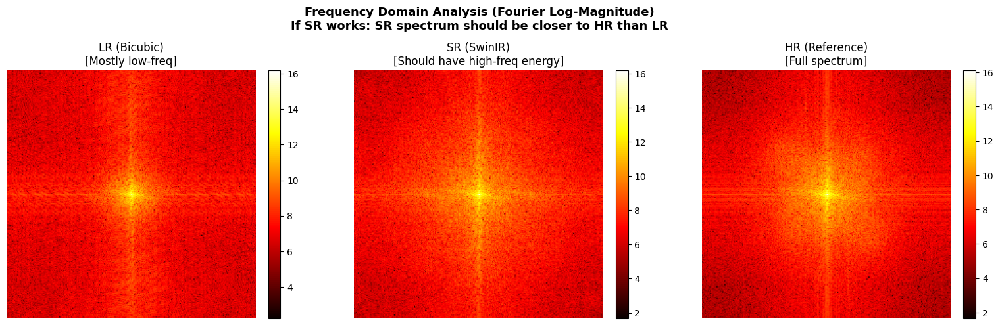

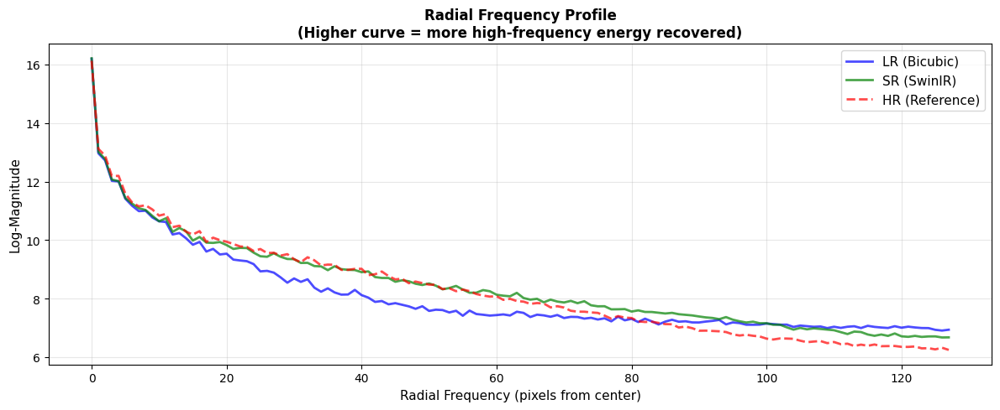


Frequency Analysis Summary:
  High-freq (outer 20%):  LR=7.01  SR=6.78  HR=6.38
  ✗ Low-frequency boost only


In [5]:
def get_frequency_spectrum(img_crop, title=""):
    """Compute power spectrum in frequency domain"""
    # Convert to grayscale for FFT
    if img_crop.ndim == 3:
        gray = cv2.cvtColor((img_crop * 255).astype(np.uint8), cv2.COLOR_BGR2GRAY).astype(np.float32)
    else:
        gray = img_crop.astype(np.float32)
    
    # FFT
    fft = np.fft.fft2(gray)
    fft_shift = np.fft.fftshift(fft)
    magnitude = np.abs(fft_shift)
    
    # Log scale for better visualization
    log_mag = np.log1p(magnitude)
    
    return log_mag

# Compute spectra
spectrum_lr = get_frequency_spectrum(lr_upsampled, "LR")
spectrum_sr = get_frequency_spectrum(sr_crop, "SR")
spectrum_hr = get_frequency_spectrum(hr_crop, "HR")

# DISPLAY: Frequency spectra comparison
fig, axes = plt.subplots(1, 3, figsize=(16, 5))

im0 = axes[0].imshow(spectrum_lr, cmap="hot")
axes[0].set_title("LR (Bicubic)\n[Mostly low-freq]")
axes[0].axis("off")
plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)

im1 = axes[1].imshow(spectrum_sr, cmap="hot")
axes[1].set_title("SR (SwinIR)\n[Should have high-freq energy]")
axes[1].axis("off")
plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

im2 = axes[2].imshow(spectrum_hr, cmap="hot")
axes[2].set_title("HR (Reference)\n[Full spectrum]")
axes[2].axis("off")
plt.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)

plt.suptitle("Frequency Domain Analysis (Fourier Log-Magnitude)\nIf SR works: SR spectrum should be closer to HR than LR\n", 
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

# Radial frequency profile (Distance from center = frequency)
def compute_radial_spectrum(log_mag):
    """Average power at each radial frequency distance"""
    h, w = log_mag.shape
    cy, cx = h // 2, w // 2
    
    y, x = np.ogrid[:h, :w]
    distance = np.sqrt((y - cy)**2 + (x - cx)**2).astype(int)
    
    radii = np.arange(0, min(h, w) // 2)
    radial_profile = []
    
    for r in radii:
        mask = distance == r
        if mask.sum() > 0:
            radial_profile.append(log_mag[mask].mean())
        else:
            radial_profile.append(0)
    
    return np.array(radial_profile)

profile_lr = compute_radial_spectrum(spectrum_lr)
profile_sr = compute_radial_spectrum(spectrum_sr)
profile_hr = compute_radial_spectrum(spectrum_hr)

# Plot radial profiles
plt.figure(figsize=(12, 5))
radii = np.arange(len(profile_lr))

plt.plot(radii, profile_lr, 'b-', linewidth=2, label="LR (Bicubic)", alpha=0.7)
plt.plot(radii, profile_sr, 'g-', linewidth=2, label="SR (SwinIR)", alpha=0.7)
plt.plot(radii, profile_hr, 'r--', linewidth=2, label="HR (Reference)", alpha=0.7)

plt.xlabel("Radial Frequency (pixels from center)", fontsize=11)
plt.ylabel("Log-Magnitude", fontsize=11)
plt.title("Radial Frequency Profile\n(Higher curve = more high-frequency energy recovered)", fontsize=12, fontweight='bold')
plt.legend(fontsize=11)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print(f"\nFrequency Analysis Summary:")
print(f"  High-freq (outer 20%):  LR={profile_lr[-20:].mean():.2f}  SR={profile_sr[-20:].mean():.2f}  HR={profile_hr[-20:].mean():.2f}")
print(f"  {'✓ SR recovering high-freq!' if profile_sr[-20:].mean() > profile_lr[-20:].mean() else '✗ Low-frequency boost only'}")


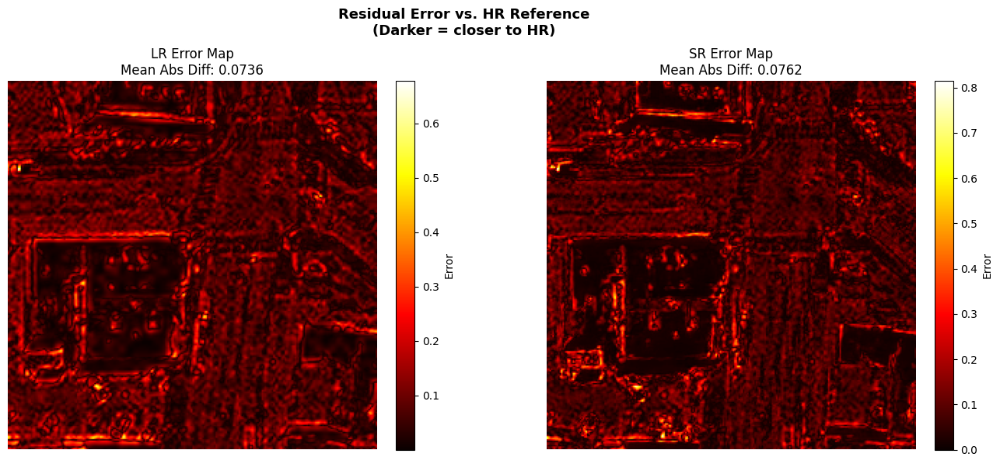


Error Statistics:
  LR Mean Error:  0.0736  (Std: 0.0550)
  SR Mean Error:  0.0762  (Std: 0.0662)
  Error Reduction: -3.5%
  ✗ No improvement


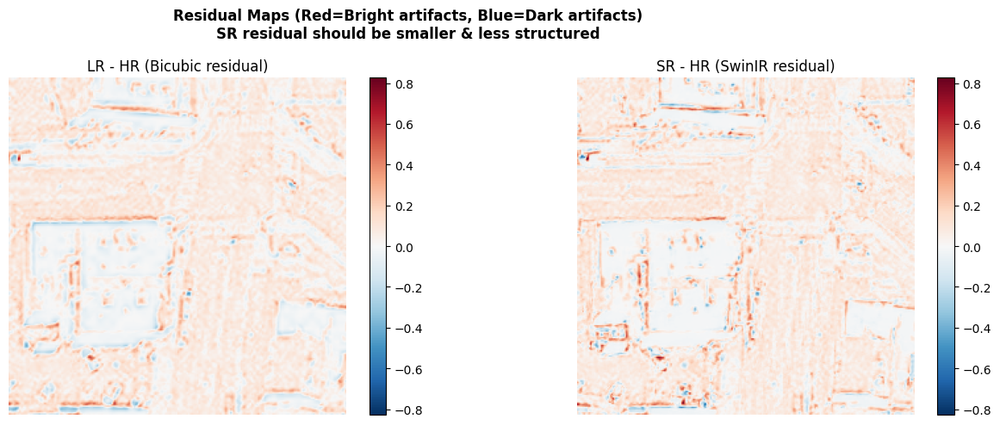

In [6]:
err_lr = np.abs(lr_upsampled - hr_crop).mean(axis=2)
err_sr = np.abs(sr_crop - hr_crop).mean(axis=2)

# DISPLAY: Error maps
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

im0 = axes[0].imshow(err_lr, cmap="hot")
axes[0].set_title(f"LR Error Map\nMean Abs Diff: {err_lr.mean():.4f}")
axes[0].axis("off")
plt.colorbar(im0, ax=axes[0], label="Error", fraction=0.046, pad=0.04)

im1 = axes[1].imshow(err_sr, cmap="hot")
axes[1].set_title(f"SR Error Map\nMean Abs Diff: {err_sr.mean():.4f}")
axes[1].axis("off")
plt.colorbar(im1, ax=axes[1], label="Error", fraction=0.046, pad=0.04)

plt.suptitle("Residual Error vs. HR Reference\n(Darker = closer to HR)", fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

print(f"\nError Statistics:")
print(f"  LR Mean Error:  {err_lr.mean():.4f}  (Std: {err_lr.std():.4f})")
print(f"  SR Mean Error:  {err_sr.mean():.4f}  (Std: {err_sr.std():.4f})")
print(f"  Error Reduction: {(err_lr.mean() - err_sr.mean()) / err_lr.mean() * 100:.1f}%")
print(f"  {'✓ SR reduced error!' if err_sr.mean() < err_lr.mean() else '✗ No improvement'}")

# DISPLAY: Residual image (SR - HR) to see hallucinations
residual_sr = sr_crop - hr_crop
residual_lr = lr_upsampled - hr_crop

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Residual with centered colormap
vmax = max(np.abs(residual_lr).max(), np.abs(residual_sr).max())

im0 = axes[0].imshow(residual_lr.mean(axis=2), cmap="RdBu_r", vmin=-vmax, vmax=vmax)
axes[0].set_title("LR - HR (Bicubic residual)")
axes[0].axis("off")
plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)

im1 = axes[1].imshow(residual_sr.mean(axis=2), cmap="RdBu_r", vmin=-vmax, vmax=vmax)
axes[1].set_title("SR - HR (SwinIR residual)")
axes[1].axis("off")
plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

plt.suptitle("Residual Maps (Red=Bright artifacts, Blue=Dark artifacts)\nSR residual should be smaller & less structured", 
             fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()


In [4]:

interpretation = """
╔════════════════════════════════════════════════════════════════════════╗
║                    SR QUALITY ASSESSMENT GUIDE                         ║
╚════════════════════════════════════════════════════════════════════════╝

1. METRIC COMPARISON (vs. HR reference)
   ├─ PSNR (Peak Signal-to-Noise Ratio)
   │  ├─ Higher is better (typical: 25-35 dB)
   │  ├─ SR-PSNR > Bicubic-PSNR → ✓ SR is sharpening
   │  └─ Gain of 2-3 dB suggests good restoration
   │
   ├─ SSIM (Structural Similarity Index)
   │  ├─ Range: 0 to 1 (1 = perfect)
   │  ├─ Typical: 0.7-0.95
   │  └─ SR-SSIM > Bicubic-SSIM → ✓ Better structure preservation
   │
   └─ Visual Inspection
      ├─ LR (Bicubic): Blurry, soft edges
      ├─ SR (SwinIR):  Should have crisp edges, recovered texture
      └─ HR (Reference): Ground truth

2. FREQUENCY ANALYSIS
   ├─ LR spectrum: Energy concentrated at LOW frequencies (blurry)
   ├─ HR spectrum: Energy spread across ALL frequencies (sharp)
   └─ SR spectrum: Should be CLOSER to HR than LR
      └─ If SR ≈ LR → ✗ Model not working
      └─ If SR ≈ HR → ✓ Good restoration

3. ERROR MAPS
   ├─ Darker regions = closer to HR (better)
   ├─ SR error < LR error → ✓ Model improving
   ├─ Structured patterns → ✗ Model hallucinating
   └─ Random noise patterns → ✓ Normal (harder pixels)

4. RESIDUAL ANALYSIS
   ├─ Residual = Output - HR Reference
   ├─ Red regions: Output too bright → Artifacts
   ├─ Blue regions: Output too dark → Artifacts
   ├─ Gray/neutral: Close to HR ✓
   └─ SR residual should be smaller than LR residual

═══════════════════════════════════════════════════════════════════════════

✓ YOUR SR IS WORKING if:
  • PSNR gain ≥ 1.5 dB over bicubic
  • SSIM ≥ 0.85 (very good structural match)
  • Frequency spectrum similar to HR (especially high-freq boost)
  • Error maps show darker regions for SR
  • Visual inspection shows crisp edges and recovered details

⚠ WARNING SIGNS (model not working):
  • PSNR loss compared to bicubic
  • SSIM < 0.7 or degrading
  • SR spectrum identical to LR (just blurry copy)
  • Colored artifacts in residuals
  • Heavy noise amplification

═══════════════════════════════════════════════════════════════════════════

NEXT STEPS:
1. Sample multiple crops from different regions (urban, rural, water)
2. Test at different upsampling factors (2×, 3×, 4×)
3. Compare with other baselines (ESRGAN, Real-ESRGAN)
4. Check log file for average metrics across entire dataset
"""

print(interpretation)


╔════════════════════════════════════════════════════════════════════════╗
║                    SR QUALITY ASSESSMENT GUIDE                         ║
╚════════════════════════════════════════════════════════════════════════╝

1. METRIC COMPARISON (vs. HR reference)
   ├─ PSNR (Peak Signal-to-Noise Ratio)
   │  ├─ Higher is better (typical: 25-35 dB)
   │  ├─ SR-PSNR > Bicubic-PSNR → ✓ SR is sharpening
   │  └─ Gain of 2-3 dB suggests good restoration
   │
   ├─ SSIM (Structural Similarity Index)
   │  ├─ Range: 0 to 1 (1 = perfect)
   │  ├─ Typical: 0.7-0.95
   │  └─ SR-SSIM > Bicubic-SSIM → ✓ Better structure preservation
   │
   └─ Visual Inspection
      ├─ LR (Bicubic): Blurry, soft edges
      ├─ SR (SwinIR):  Should have crisp edges, recovered texture
      └─ HR (Reference): Ground truth

2. FREQUENCY ANALYSIS
   ├─ LR spectrum: Energy concentrated at LOW frequencies (blurry)
   ├─ HR spectrum: Energy spread across ALL frequencies (sharp)
   └─ SR spectrum: Should be CLOSER to 

In [7]:
!exiftool "{image_path}"

ExifTool Version Number         : 12.40
File Name                       : 103001010C487900-visual.tif
Directory                       : /home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/maxar-dataset-pak/la-wildfire-59cm
File Size                       : 77 MiB
File Modification Date/Time     : 2026:07:06 12:19:47+05:00
File Access Date/Time           : 2026:07:06 12:24:25+05:00
File Inode Change Date/Time     : 2026:07:06 12:19:47+05:00
File Permissions                : -rw-rw-r--
File Type                       : BTF
File Type Extension             : btf
MIME Type                       : image/x-tiff-big
Image Width                     : 17408
Image Height                    : 17408
Bits Per Sample                 : 8 8 8
Compression                     : JPEG
Photometric Interpretation      : YCbCr
Samples Per Pixel               : 3
Planar Configuration            : Chunky
Y Cb Cr Sub Sampling            : YCbCr4:2:0 (2 2)
Reference Black White           : 0 255 128 255 12

In [8]:
!gdalinfo "{image_path}"

Driver: GTiff/GeoTIFF
Files: /home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/maxar-dataset-pak/la-wildfire-59cm/103001010C487900-visual.tif
Size is 17408, 17408
Coordinate System is:
PROJCRS["WGS 84 / UTM zone 11N",
    BASEGEOGCRS["WGS 84",
        DATUM["World Geodetic System 1984",
            ELLIPSOID["WGS 84",6378137,298.257223563,
                LENGTHUNIT["metre",1]]],
        PRIMEM["Greenwich",0,
            ANGLEUNIT["degree",0.0174532925199433]],
        ID["EPSG",4326]],
    CONVERSION["UTM zone 11N",
        METHOD["Transverse Mercator",
            ID["EPSG",9807]],
        PARAMETER["Latitude of natural origin",0,
            ANGLEUNIT["degree",0.0174532925199433],
            ID["EPSG",8801]],
        PARAMETER["Longitude of natural origin",-117,
            ANGLEUNIT["degree",0.0174532925199433],
            ID["EPSG",8802]],
        PARAMETER["Scale factor at natural origin",0.9996,
            SCALEUNIT["unity",1],
            ID["EPSG",8805]],
        P

In [14]:
from osgeo import gdal

# Enable explicit exceptions to catch errors cleanly
gdal.UseExceptions()

try:
    file_path = image_path
    dataset = gdal.Open(file_path)
    print(gdal.Info(dataset))
except Exception as e:
    print(f"Error opening file: {e}")


Driver: GTiff/GeoTIFF
Files: /home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/maxar-dataset-pak/pakistan-flood-images-36cm/single-img/1040010076369100-visual.tif
Size is 17408, 17408
Coordinate System is:
PROJCRS["WGS 84 / UTM zone 42N",
    BASEGEOGCRS["WGS 84",
        DATUM["World Geodetic System 1984",
            ELLIPSOID["WGS 84",6378137,298.257223563,
                LENGTHUNIT["metre",1]]],
        PRIMEM["Greenwich",0,
            ANGLEUNIT["degree",0.0174532925199433]],
        ID["EPSG",4326]],
    CONVERSION["UTM zone 42N",
        METHOD["Transverse Mercator",
            ID["EPSG",9807]],
        PARAMETER["Latitude of natural origin",0,
            ANGLEUNIT["degree",0.0174532925199433],
            ID["EPSG",8801]],
        PARAMETER["Longitude of natural origin",69,
            ANGLEUNIT["degree",0.0174532925199433],
            ID["EPSG",8802]],
        PARAMETER["Scale factor at natural origin",0.9996,
            SCALEUNIT["unity",1],
            ID["EPSG

In [ ]:
with rasterio.open(image_path) as src:
    for attr in sorted([x for x in dir(src) if not x.startswith("_")]):
        print(attr)

WRONG IMAGE OUTPUT - LEFT ONLY AS A REFERENCE (NOT TO BE USED FOR DOWNSTREAM TASKS) - USES SCALE FACTOR OF 8 TO DISPLAY & PROCESS THE IMAGE FASTLY

In [ ]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

# ==================================================
# CHANGE ONLY THIS
wr_image_path = image_path
# ==================================================

with rasterio.open(wr_image_path) as src:

    print("=" * 70)
    print("IMAGE INFORMATION")
    print("=" * 70)

    print(f"File           : {wr_image_path}")
    print(f"Width          : {src.width}")
    print(f"Height         : {src.height}")
    print(f"Bands          : {src.count}")
    print(f"Data Type      : {src.dtypes}")
    print(f"CRS            : {src.crs}")
    print(f"Transform      :")
    print(src.transform)

    print("\nBand Statistics")
    print("-" * 70)

    for band_idx in range(1, src.count + 1):
        band = src.read(band_idx)

        print(
            f"Band {band_idx}: "
            f"min={band.min():>8} "
            f"max={band.max():>8} "
            f"mean={band.mean():>10.2f} "
            f"std={band.std():>10.2f}"
        )

    # ------------------------------------------------
    # Read RGB preview (downsampled for speed)
    # ------------------------------------------------

    scale_factor = 8

    rgb = src.read(
        [1, 2, 3],
        out_shape=(
            3,
            src.height // scale_factor,
            src.width // scale_factor
        )
    )

# ==================================================
# Prepare RGB for display
# ==================================================

rgb = np.transpose(rgb, (1, 2, 0)).astype(np.float32)

rgb_display = rgb.copy()

for c in range(3):
    p2, p98 = np.percentile(rgb_display[:, :, c], (2, 98))

    rgb_display[:, :, c] = (
        rgb_display[:, :, c] - p2
    ) / (p98 - p2)

rgb_display = np.clip(rgb_display, 0, 1)

# ==================================================
# Display image
# ==================================================

plt.figure(figsize=(12, 12))
plt.imshow(rgb_display)
plt.title("RGB Preview (2-98% Contrast Stretch)")
plt.axis("off")
plt.show()

# ==================================================
# Histograms
# ==================================================

fig, ax = plt.subplots(figsize=(10, 5))

colors = ["red", "green", "blue"]

for c in range(3):
    ax.hist(
        rgb[:, :, c].ravel(),
        bins=256,
        alpha=0.4,
        label=f"Band {c+1}",
    )

ax.set_title("RGB Histogram")
ax.set_xlabel("Pixel Value")
ax.set_ylabel("Frequency")
ax.legend()

plt.show()

SyntaxError: unterminated string literal (detected at line 21) (1304238138.py, line 21)

Percentile information extraction of the image (reproduced here again for clarity)                                                                                                      

In [ ]:
with rasterio.open(image_path) as src:
    print(src.colorinterp)

    rgb = src.read([1,2,3])
    
    for b in range(1, src.count + 1):
        band = src.read(b)

        print(
            f"Band {b}: "
            f"P1={np.percentile(band,1):.0f}, "
            f"P5={np.percentile(band,5):.0f}, "
            f"P95={np.percentile(band,95):.0f}, "
            f"P99={np.percentile(band,99):.0f}"
        )

for i in range(3):
    print(f"Band {i+1} mean:", rgb[i].mean())

(<ColorInterp.red: 3>, <ColorInterp.green: 4>, <ColorInterp.blue: 5>)
(None, None, None)
{}
Band 1: P1=0, P5=385, P95=2494, P99=3230
Band 2: P1=0, P5=419, P95=2094, P99=2742
Band 3: P1=0, P5=652, P95=1475, P99=1872
Band 1 mean: 1268.2366725900526
Band 2 mean: 1157.7759441825344
Band 3 mean: 977.5414589314162


Using global contrast stretching and correct band order, the orange/tan like coloring of the semi-arid landscape is preserved

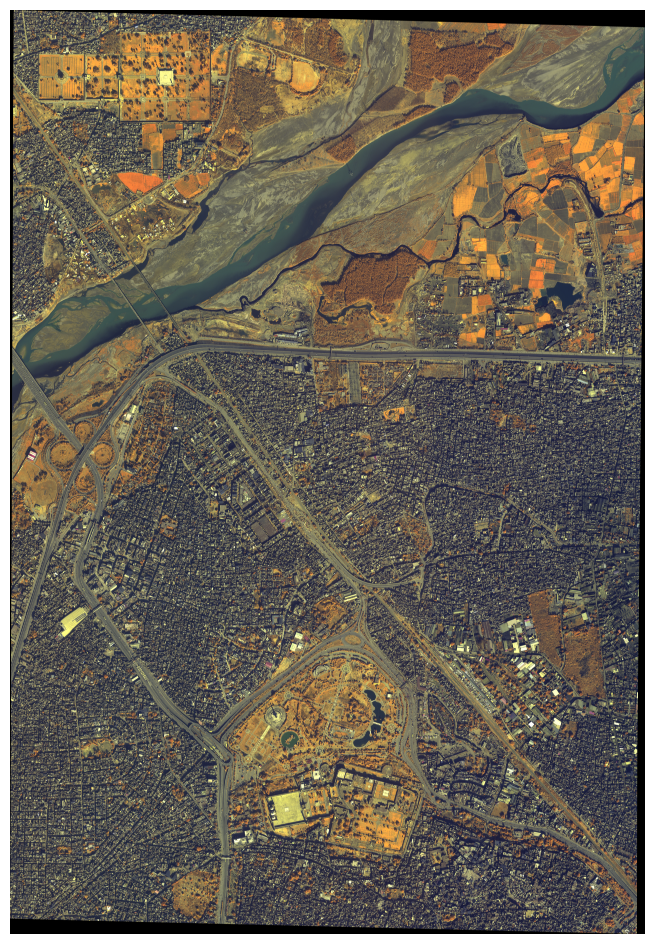

In [4]:
rgb = np.transpose(rgb, (1, 2, 0)).astype(np.float32)

rgb_display = rgb / np.percentile(rgb, 99.5)

rgb_display = np.clip(rgb_display, 0, 1)

plt.figure(figsize=(12,12))
plt.imshow(rgb_display)
plt.axis("off")
plt.show()

Wrong order of bands produced this blue even with global contrast stretching included

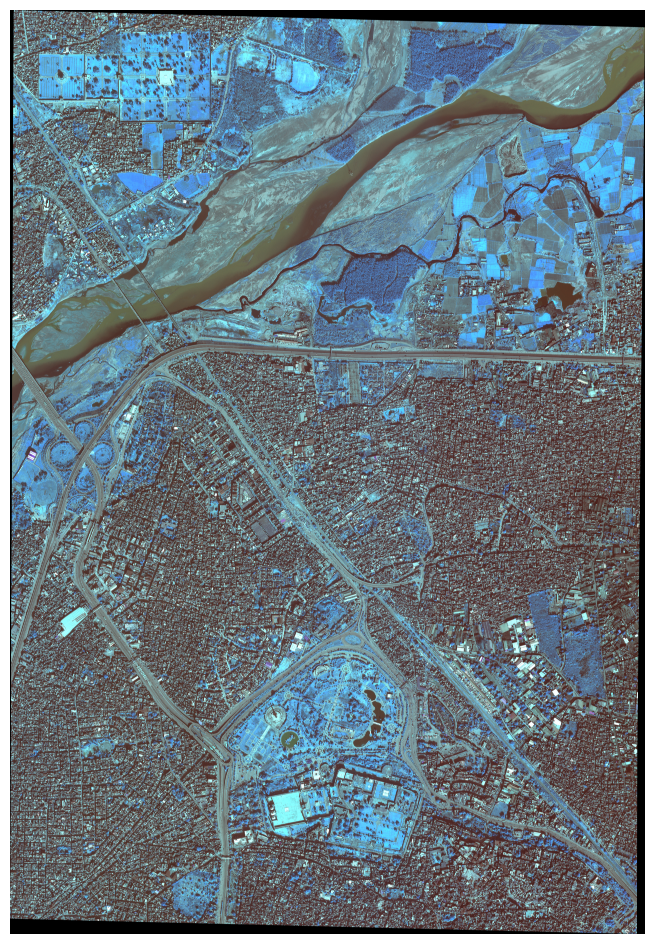

In [6]:
rgb_test = rgb[:, :, [2,1,0]]

low  = np.percentile(rgb_test, 2)
high = np.percentile(rgb_test, 98)

rgb_test = np.clip((rgb_test - low)/(high-low),0,1)

plt.figure(figsize=(12,12))
plt.imshow(rgb_test)
plt.axis("off")
plt.show()

In [ ]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

# ==================================================
# CHANGE ONLY THIS
# ==================================================
image_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/airbus/IMG_PNEO3_STD_202601250555400_PMS-FS_ORT_1e224074-3a2a-4f29-cfe4-ab0a484fbd47_NED_R1C1.JP2"
# ==================================================

# --------------------------------------------------
# OPEN IMAGE
# --------------------------------------------------

with rasterio.open(image_path) as src:

    print("=" * 80)
    print("IMAGE INFORMATION")
    print("=" * 80)

    print(f"File            : {image_path}")
    print(f"Width           : {src.width}")
    print(f"Height          : {src.height}")
    print(f"Bands           : {src.count}")
    print(f"Data Type       : {src.dtypes}")
    print(f"CRS             : {src.crs}")
    print(f"NoData          : {src.nodata}")
    print(f"ColorInterp     : {src.colorinterp}")

    print("\nAffine Transform")
    print(src.transform)

    print("\n" + "=" * 80)
    print("BAND STATISTICS")
    print("=" * 80)

    for band_idx in range(1, src.count + 1):

        band = src.read(band_idx)

        print(f"\nBand {band_idx}")

        print(f"min    : {band.min()}")
        print(f"max    : {band.max()}")
        print(f"mean   : {band.mean():.2f}")
        print(f"std    : {band.std():.2f}")

        print(f"P1     : {np.percentile(band,1):.0f}")
        print(f"P5     : {np.percentile(band,5):.0f}")
        print(f"P95    : {np.percentile(band,95):.0f}")
        print(f"P99    : {np.percentile(band,99):.0f}")
        print(f"P99.5  : {np.percentile(band,99.5):.0f}")
        print(f"P99.9  : {np.percentile(band,99.9):.0f}")

    # --------------------------------------------------
    # Read RGB bands
    # --------------------------------------------------

    rgb = src.read([1, 2, 3])

# --------------------------------------------------
# PREPARE RGB IMAGE
# --------------------------------------------------

rgb = np.transpose(rgb, (1, 2, 0)).astype(np.float32)

# --------------------------------------------------
# GLOBAL PERCENTILE STRETCH
# (Preserves color balance)
# --------------------------------------------------

low = np.percentile(rgb, 2)
high = np.percentile(rgb, 98)

rgb_display = (rgb - low) / (high - low)
rgb_display = np.clip(rgb_display, 0, 1)

print("\n" + "=" * 80)
print("DISPLAY STRETCH")
print("=" * 80)

print(f"Global P2  : {low:.2f}")
print(f"Global P98 : {high:.2f}")

# --------------------------------------------------
# DISPLAY IMAGE
# --------------------------------------------------

plt.figure(figsize=(12, 12))
plt.imshow(rgb_display)
plt.title("RGB Preview (Global 2-98% Stretch)")
plt.axis("off")
plt.show()

# --------------------------------------------------
# RGB HISTOGRAMS
# --------------------------------------------------

plt.figure(figsize=(12, 6))

for i, label in enumerate(["Red", "Green", "Blue"]):
    plt.hist(
        rgb[:, :, i].ravel(),
        bins=256,
        alpha=0.4,
        label=label
    )

plt.title("RGB Histograms")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.legend()
plt.show()

# --------------------------------------------------
# CHANNEL MEANS SUMMARY
# --------------------------------------------------

print("\n" + "=" * 80)
print("CHANNEL MEANS")
print("=" * 80)

print(f"Red Mean   : {rgb[:,:,0].mean():.2f}")
print(f"Green Mean : {rgb[:,:,1].mean():.2f}")
print(f"Blue Mean  : {rgb[:,:,2].mean():.2f}")